Make Movie - Shaivi Sanchorawala
Resources:
https://www.geeksforgeeks.org/python-os-listdir-method/


TO DO:
ASK Mr. T HOW TO GO ABOUT TRACKING THESE FILAMENTS

In [2]:
import os
import numpy as np
import math
import sys
import time
from PIL import Image
from PIL import Image, ImageOps, ImageDraw
import matplotlib.pyplot as plt
%matplotlib inline
from astropy.io import fits
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)

Set up path which will be used in for loop:

In [3]:
path_default = "/sanhome/shaivi/data/Phil_Shirts"
path_list = os.listdir(path_default)
print("Files and directories in '", path_default, "' :") 
print(path_list)

Files and directories in ' /sanhome/shaivi/data/Phil_Shirts ' :
['f2m_044.png', '._SPcubes_20170915_224806_fillfac_index.fits', 'penumbra_50.png', 'penumbra_45.png', 'SPcubes_20170915_224806_blapp_index.fits', 'f2m_051.png', '._SPcubes_20170915_224806_magazim_index.fits', '._SPcubes_20170915_224806_magfield_index.fits', 'f2m_048.png', 'f2m_052.png', 'penumbra_46.png', 'penumbra_53.png', 'f2m_047.png', '._SPcubes_20170915_224806_dopp2_index.fits', 'penumbra_49.png', 'penumbra_55.png', 'SPcubes_20170915_224806_btapp_index.fits', 'f2m_041.png', 'f2m_054.png', 'penumbra_40.png', 'penumbra_43.png', 'f2m_057.png', 'plot image test', 'f2m_042.png', 'penumbra_56.png', 'penumbra_33.png', 'f2m_027.png', '._SPcubes_20170915_224806_rufaz_index.fits', 'SPcubes_20170915_224806_dopp1_index.fits', 'penumbra_00.png', 'f2m_014.png', 'penumbra_29.png', 'f2m_001.png', 'penumbra_15.png', '._SPcubes_20170915_224806_magincl_index.fits', 'f2m_028.png', 'f2m_032.png', 'penumbra_26.png', '._new_out.mov', 'penum

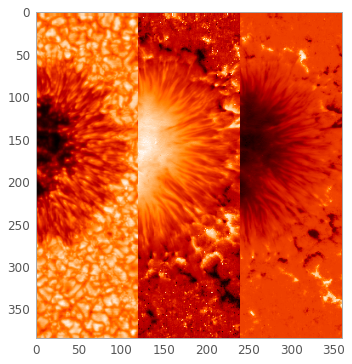

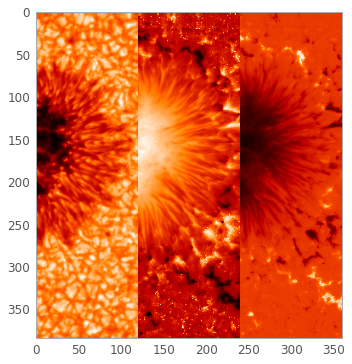

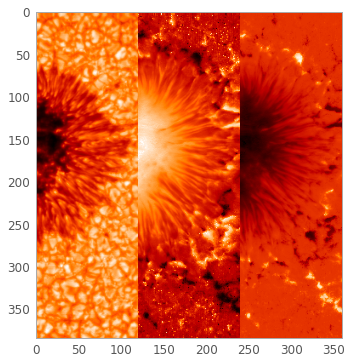

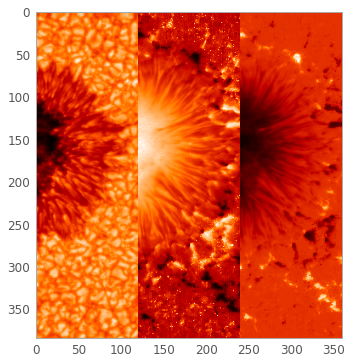

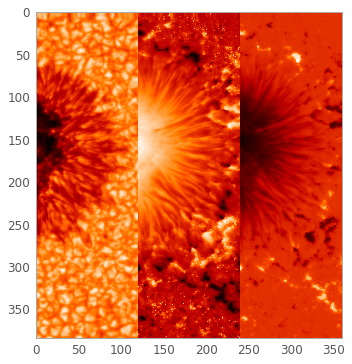

...

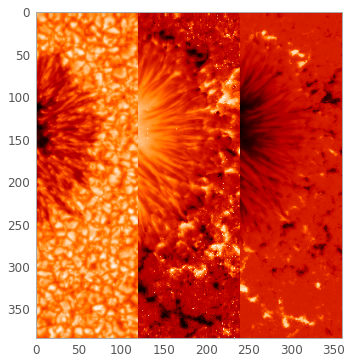

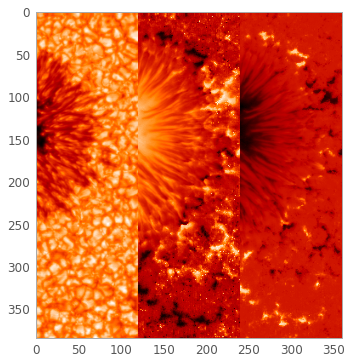

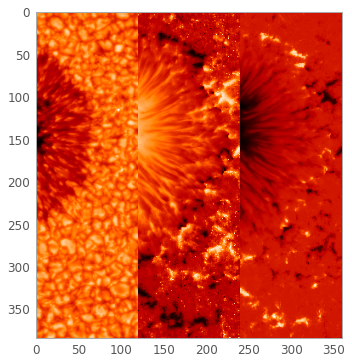

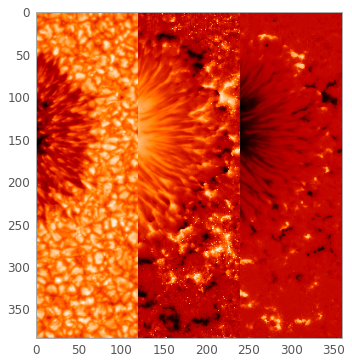

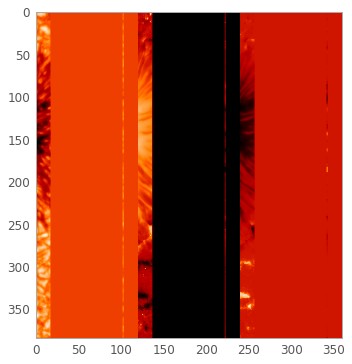

In [149]:
#development: focus on 59 in fits files.

conti = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_conti_index.fits')
magincl = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_magincl_index.fits')
magfield = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_magfield_index.fits')

num_scans = 59
data_conti = list()
data_magincl = list()
data_Bz = list()
movieframes = list()

for i in range(num_scans):
    data_conti_temp = conti[i+1].data
    data_conti_2=(data_conti_temp - data_conti_temp.min())*(255.0/(data_conti_temp - data_conti_temp.min()).max())
    data_conti.append(data_conti_2)
    
    data_magincl_temp = magincl[i+1].data
    data_magincl_2=(data_magincl_temp - data_magincl_temp.min())*(255.0/(data_magincl_temp - data_magincl_temp.min()).max())
    data_magincl.append(data_magincl_2)

    data_magfield_temp = magfield[i+1].data
    Bz_temp =  data_magfield_temp*(np.cos(np.array(np.deg2rad(data_magincl_temp))))
    data_Bz_2=(Bz_temp - Bz_temp.min())*(255.0/(Bz_temp - Bz_temp.min()).max())
    data_Bz.append(data_Bz_2)
    
    temp_frames = np.concatenate((data_conti_2, data_magincl_2, data_Bz_2), axis =1)
    plt.pause(1)
    plt.grid(False)
    plt.imshow(temp_frames)
    plt.savefig('/sanhome/shaivi/data/Phil_Shirts/penumbra_{0:02d}.png'.format(i))
    movieframes.append(temp_frames)
    

In [5]:
#development: focus on 59 in fits files.

conti = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_conti_index.fits')
magincl = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_magincl_index.fits')
magfield = fits.open('file:///sanhome/shaivi/data/Phil_Shirts/SPcubes_20170915_224806_magfield_index.fits')

num_scans = 59
dim = conti[1].data.shape
data_conti = np.zeros((dim[0], dim[1], num_scans))

for i in range(num_scans):
    data_conti_temp = conti[i+1].data
    data_conti_2=(data_conti_temp - data_conti_temp.min())*(255.0/(data_conti_temp - data_conti_temp.min()).max())
    data_conti[:,:,i] = data_conti_2
    
    
  

In [6]:
data_conti.shape

(384, 120, 59)

In [9]:
import numpy as np
from matplotlib import pyplot as plt
import sys
sys.path.append('/Users/shaivi/mypy/')
import tvg
plt.ion()

In [10]:
tvg.show(data_conti)


[0, 120, 0, 384]
(384, 120, 59) [1, 1, 1]
lim_ima2show [0.0, 255.0]
dentro
[]


{'ori_coord_values': [],
 'scaled_coord_values': [],
 'scale': [1, 1, 1],
 'extent': [0, 120, 0, 384],
 'inaxis3': 0,
 'lim_ima2show': []}

In [11]:
np.save('test_conti.npy', data_conti)

In [12]:
pwd


'/Users/shaivi/Downloads'